In [2]:
import os
import re
import editdistance
from PIL import Image
import numpy as np
import cv2
import pytesseract
import easyocr
from matplotlib import pyplot as plt
from torchmetrics import WordErrorRate, CharErrorRate, MatchErrorRate

In [3]:
%matplotlib inline

In [4]:
pytesseract.pytesseract.tesseract_cmd = r'/opt/homebrew/bin/tesseract'
reader = easyocr.Reader(['en'])

CUDA not available - defaulting to CPU. Note: This module is much faster with a GPU.


In [5]:
cur_path = os.path.dirname(os.getcwd())
data_path = os.path.join(cur_path, "data/natation/")

dic_names = {}
for file in os.listdir(data_path):
    if file[-4:] == ".txt":
        with open(os.path.join(data_path, file), 'r') as f:
            names = f.readlines()
            for n in names:
                complete_name = n.strip().split()[:-1]
                last_name = complete_name[:-1]
                first_name = complete_name[-1]
                if len(last_name) == 1:
                    last_name = ' '.join(complete_name[:-1])
                    if last_name in dic_names:
                        continue
                    else:
                        dic_names[last_name] = first_name
                else:
                    for ln in last_name:
                        if ln in dic_names:
                            continue
                        else:
                            dic_names[ln] = first_name

In [6]:
def get_ground_truth(path):
    """Returns ground truth data

    Args:
        path (str): path to the ground truth txt file

    Returns:
        list: list of the ground truth data
    """

    with open(path, "r") as f:
        return [line.strip() for line in f.readlines()]

In [7]:
def reformat_easyocr(raw_predictions):
    return [pred[1] for pred in raw_predictions]

def infer(ocr_engine, img):
    if ocr_engine == "pytesseract":
        return pytesseract.image_to_string(Image.open(img)).split('\n')
    elif ocr_engine == "easyocr":
        return reformat_easyocr(reader.readtext(img))
    else:
        doc = DocumentFile.from_images(img)
        result = predictor(doc)
        return reformat_doctr(result.export()['pages'][0]["blocks"])

def get_cleaned_prediction(prediction, dic_names, min_edit_distance=2):
    """Returns a cleaned version of the raw prediction

    Args:
        prediction (str): raw prediction
        dic_names (dict): dictionary of the names of players
        min_edit_distance (int, optional): minimum allowed edit distance to keep a predicted last name. Defaults to 2.

    Returns:
        list: list of the clean elements in the raw prediction
    """

    cprediction = []

    real_first_name = '' # Will keep in memory the "real" first name
    added_first_name = False # Keep a tab if the first name was added or not

    # We use the last name as a reference for deciding to keep a prediction
    for comp in prediction.strip().split(' '):
        added = False # A component of the prediction has to be corrected and added only one time
        # If a first name was found, check if this part of the 
        # prediction is that first name
        if len(real_first_name) > 0:
            if editdistance.eval(real_first_name, comp) <= min_edit_distance:
                cprediction.append(comp)
        for n in dic_names.keys():
            if not added:
                if editdistance.eval(n, comp) <= min_edit_distance:
                    # We add all the last names of the player
                    cprediction.append(comp)
                    # We keep in memory the first name corresponding to that last name
                    real_first_name = dic_names[n]
                    added = True
    
    # Now we add the score if we find one
    found_score = re.findall(r"\d{2}[.,]\d{2}", prediction.strip())
    if len(found_score) > 0:
        if "," in found_score[0]:
            # We noramlize the scores
            cprediction.append(".".join(found_score[0].split(",")))
        else:
            cprediction.append(found_score[0])
                
    return cprediction

def get_predictions_of_interest(predictions, dic_names):
    """Returns cleaned predictions that are probably correct

    Args:
        predictions (list): raw predictions
        dic_names (dict): dictionary of all the players names

    Returns:
        list: cleaned predictions
    """
    
    preds = []
    for pred in predictions:
        #cpred = get_prediction_last_name(pred, dic_names)
        cpred = get_cleaned_prediction(pred, dic_names)
        if len(cpred) == 0:
            continue
        elif len(cpred) == 1:
            preds.extend(cpred)
        else:
            cpred = ' '.join(cpred)
            preds.append(cpred)
    return preds

In [39]:
path_tuples = [(f"00000{i}.png", f"00000{i}.txt") for i in range(10)]
path_tuples.extend([(f"0000{i}.png", f"0000{i}.txt") for i in range(10, 15)])

i = 10
im_path = data_path + path_tuples[i][0]
gt_path = data_path + path_tuples[i][1]

In [40]:
ocr_engine = "easyocr"
get_predictions_of_interest(infer(ocr_engine, im_path), dic_names)

['51.71',
 '02.04',
 'CR',
 '51.71',
 'MANUEL',
 'COMERFORD',
 'AUS',
 '52.04',
 'McKEON',
 '53.22',
 'SJOESTROEM',
 'AUS',
 '52.75',
 'CAMPBELL',
 'CANE',
 'RUCK',
 '52.46',
 'NED',
 'HEEMSKERK',
 '52.43',
 'GBR',
 'ANDERSON',
 '53.03',
 '53.05',
 'TOOM',
 '53.44',
 'E',
 'E']

In [41]:
import math

In [58]:
i = 0
im_path = data_path + path_tuples[i][0]
gt_path = data_path + path_tuples[i][1]

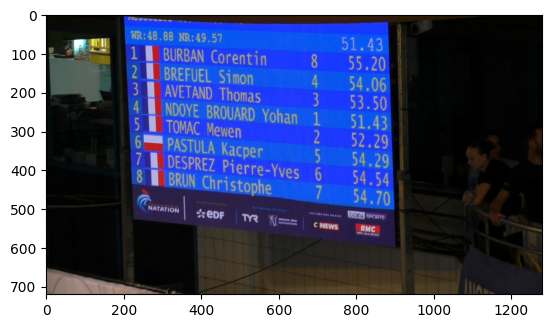

In [59]:
# Load image
img = cv2.imread(im_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Get bounding boxes of text in the image
boxes = reader.readtext(im_path)

# Compute the average orientation of text in the image with respect to the x-axis
angle_sum = 0
count = 0
for el in boxes:
    if len(el[0]) == 4:
        x1, y1, x2, y2 = el[0][0][0], el[0][0][1], el[0][-1][0], el[0][-1][1]
        angle = math.atan2(int(y2) - int(y1), int(x2) - int(x1))
        angle_sum += angle
        count += 1
average_angle = angle_sum / count

# Reorient the image according to the average angle
height, width = img.shape[:2]
center = (width // 2, height // 2)
M = cv2.getRotationMatrix2D(center, math.degrees(average_angle) - 90, 1.0)
rotated = cv2.warpAffine(img, M, (width, height), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)

# Show the original and rotated images side by side
plt.imshow(img)

In [62]:
np.degrees(average_angle)

90.86103220565947

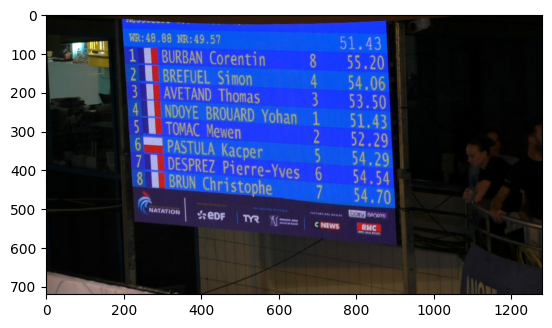

In [60]:
plt.imshow(rotated)

In [162]:
i = 4
im_path = data_path + path_tuples[i][0]
gt_path = data_path + path_tuples[i][1]

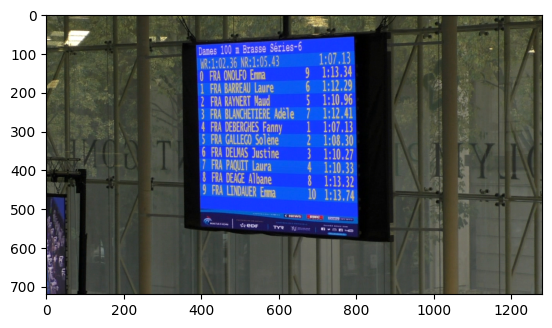

In [163]:
# Load image
img = cv2.imread(im_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Get bounding boxes of text in the image
boxes = reader.readtext(im_path)

# Compute the average orientation of text in the image with respect to the x-axis
angle_sum = 0
count = 0
for el in boxes:
    if len(el[0]) == 4:
        first_point = el[0][0]
        second_point = el[0][2]

        # Define the two points as column vectors
        A = np.array([[first_point[0]], [first_point[1]]])
        B = np.array([[second_point[0]], [second_point[1]]])

        # Define the x-axis vector as a column vector
        x_axis = np.array([[1], [0]])

        # Compute the vector from A to B
        vector_AB = B - A

        # Compute the dot product between the vector AB and the x-axis vector
        dot_product = np.dot(vector_AB.T, x_axis)

        # Compute the magnitudes of the vectors
        magnitude_AB = np.linalg.norm(vector_AB)
        magnitude_x_axis = np.linalg.norm(x_axis)

        # Compute the cosine of the angle between the vector and the x-axis
        cosine_angle = dot_product / (magnitude_AB * magnitude_x_axis)

        # Compute the angle in radians using the arccosine function
        angle = np.arccos(cosine_angle)

        angle_sum += angle
        count += 1

        # delta_x = second_point[0] - first_point[0]
        # delta_y = second_point[1] - first_point[1]
        # angle = math.atan2(delta_y, delta_x)
        # angle_sum += angle
        # count += 1

average_angle = angle_sum / count
average_angle -= math.pi/4

# Reorient the image according to the average angle
height, width = img.shape[:2]
center = (width // 2, height // 2)
M = cv2.getRotationMatrix2D(center, math.degrees(average_angle[0][0]), 1.0)
rotated = cv2.warpAffine(img, M, (width, height), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)

# Show the original and rotated images side by side
plt.imshow(img)

In [164]:
np.degrees(average_angle[0][0])

-16.19430612972451

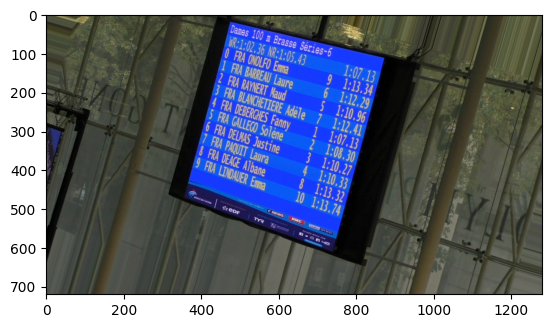

In [165]:
plt.imshow(rotated)

---

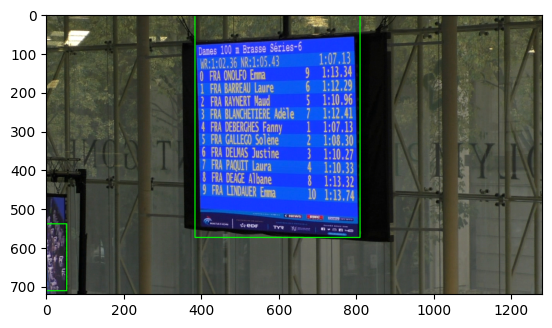

In [35]:
# im_path
org_im = cv2.imread(im_path)
org_im = cv2.cvtColor(org_im, cv2.COLOR_BGR2RGB)

org_bboxes = pytesseract.image_to_boxes(org_im, lang='eng+fra').split('\n')
org_bboxes = [elem[2:] for elem in org_bboxes]
org_bboxes = [elem.split(' ') for elem in org_bboxes]
org_new_bboxes = []
for i in range(len(org_bboxes)):
    if len(org_bboxes[i]) < 4:
        continue
    org_new_bboxes.append((int(org_bboxes[i][0]), int(org_bboxes[i][1]), int(org_bboxes[i][2]), int(org_bboxes[i][3])))

org_h, org_w, org_c = org_im.shape
for region in org_new_bboxes:
    x1, y1, x2, y2 = region
    cv2.rectangle(org_im, (x1, org_h - y1), (x2, org_h - y2), (0, 255, 0), 2)

plt.imshow(org_im)
#plt.axis("off")

In [13]:
# im_path
org_im = cv2.imread(im_path)
org_im = cv2.cvtColor(org_im, cv2.COLOR_BGR2RGB)

org_bboxes = pytesseract.image_to_boxes(org_im, lang='eng+fra').split('\n')
org_bboxes = [elem[2:] for elem in org_bboxes]
org_bboxes = [elem.split(' ') for elem in org_bboxes]
org_new_bboxes = []
for i in range(len(org_bboxes)):
    if len(org_bboxes[i]) < 4:
        continue
    org_new_bboxes.append((int(org_bboxes[i][0]), int(org_bboxes[i][1]), int(org_bboxes[i][2]), int(org_bboxes[i][3])))

org_h, org_w, org_c = org_im.shape
for region in org_new_bboxes:
    x1, y1, x2, y2 = region
    cv2.rectangle(org_im, (x1, org_h - y1), (x2, org_h - y2), (0, 255, 0), 2)

# Iterate over each bounding box and compute its orientation
orientations = []
for region in org_new_bboxes:
    # Compute the moments of the bounding box
    x1, y1, x2, y2 = region
    moments = cv2.moments(np.array([(x1, org_h - y1), (x1 + org_w, org_h - y1), (x1 + org_w, org_h - y1 + org_h), (x2, org_h - y2)]))
    
    # Compute the orientation from the moments
    orientation = 0.5 * np.arctan2(2 * moments['mu11'], moments['mu20'] - moments['mu02'])
    
    # Append the orientation to the list of orientations
    orientations.append(orientation)

# Compute the average orientation
avg_orientation = np.mean(orientations)

In [14]:
avg_orientation

0.3908952641707446

In [15]:
print("Average orientation: {:.2f} degrees".format(np.degrees(avg_orientation)))

Average orientation: 22.40 degrees


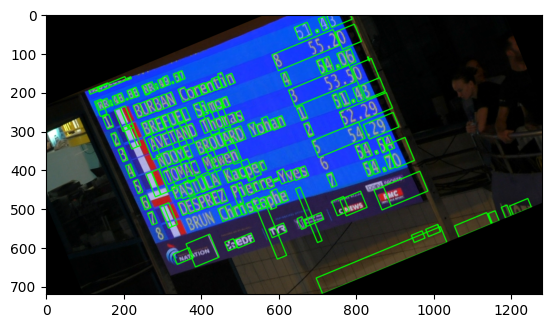

In [24]:
# Compute the rotation matrix for the image
M = cv2.getRotationMatrix2D((org_im.shape[1] / 2, org_im.shape[0] / 2), np.degrees(avg_orientation), 1)

# Rotate the image
rotated_image = cv2.warpAffine(org_im, M, (org_im.shape[1], org_im.shape[0]))

# Display the rotated image
plt.imshow(rotated_image)

---

In [9]:
def compute_metrics(predictions_of_interest, last_names_ground_truth):
    mers = {yhat: 0 for yhat in predictions_of_interest}
    wers = {yhat: 0 for yhat in predictions_of_interest}
    cers = {yhat: 0 for yhat in predictions_of_interest}

    mer = MatchErrorRate()
    wer = WordErrorRate()
    cer = CharErrorRate()

    for yhat in predictions_of_interest:
        min_mer_error_rate = 1000
        min_wer_error_rate = 1000
        min_cer_error_rate = 1000
        for y in last_names_ground_truth:
            if mer(yhat, y) < min_mer_error_rate:
                min_mer_error_rate = mer(yhat, y)
            if wer(yhat, y) < min_wer_error_rate:
                min_wer_error_rate = wer(yhat, y)
            if cer(yhat, y) < min_cer_error_rate:
                min_cer_error_rate = cer(yhat, y)
        mers[yhat] = min_mer_error_rate.item()
        wers[yhat] = min_wer_error_rate.item()
        cers[yhat] = min_cer_error_rate.item()

    return mers, wers, cers

In [10]:
def compute_metrics_for_image(gt_path, im_path, dic_names):
    ground_truth = get_ground_truth(gt_path)
    last_names_ground_truth = get_last_names_ground_truth(ground_truth)

    predictions = pytesseract.image_to_string(Image.open(im_path)).split('\n')
    predictions = get_predictions_of_interest(predictions, dic_names)

    return compute_metrics(predictions, last_names_ground_truth)

In [11]:
def get_final_metric(gt_path, im_path, dic_names):
    ground_truth = get_ground_truth(gt_path)
    ground_truth = get_last_names_ground_truth(ground_truth)

    mers, wers, cers = compute_metrics_for_image(gt_path, im_path, dic_names)
    global_mer = sum(mers.values())/len(ground_truth)
    global_wer = sum(wers.values())/len(ground_truth)
    global_cer = sum(cers.values())/len(ground_truth)
    
    return global_mer, global_wer, global_cer, (global_mer + global_wer + global_cer) / 3

In [12]:
path_tuples = [(f"00000{i}.png", f"00000{i}.txt") for i in range(10)]
path_tuples.extend([(f"0000{i}.png", f"0000{i}.txt") for i in range(10, 15)])

In [13]:
def evaluate(data_path, path_tuples, dic_names, roi_path='', clip_text_prompt='', clip_visual_prompt=''):
    metrics = []
    mers = []
    wers = []
    cers = []
    for i in range(len(path_tuples)):
        im_path = data_path + roi_path + clip_text_prompt + clip_visual_prompt + path_tuples[i][0]
        gt_path = data_path + path_tuples[i][1]
        m, w, c, gm = get_final_metric(gt_path, im_path, dic_names)
        metrics.append(gm)
        mers.append(m)
        wers.append(w)
        cers.append(c)
    return sum(mers)/len(mers), sum(wers)/len(wers), sum(cers)/len(cers), sum(metrics)/len(metrics)

In [14]:
i = 0
im_path = data_path + path_tuples[i][0]
gt_path = data_path + path_tuples[i][1]
compute_metrics_for_image(gt_path, im_path, dic_names)

({'BL BURBAN': 0.5,
  'BREFUEL': 0.0,
  'AVETAND': 0.0,
  'NDOYE BROUARD': 0.0,
  'B_TOMAC': 1.0,
  'PASTULA': 0.0,
  'HL DESPREZ': 0.5,
  'SE SE': 1.0},
 {'BL BURBAN': 1.0,
  'BREFUEL': 0.0,
  'AVETAND': 0.0,
  'NDOYE BROUARD': 0.0,
  'B_TOMAC': 1.0,
  'PASTULA': 0.0,
  'HL DESPREZ': 1.0,
  'SE SE': 1.0},
 {'BL BURBAN': 0.5,
  'BREFUEL': 0.0,
  'AVETAND': 0.0,
  'NDOYE BROUARD': 0.0,
  'B_TOMAC': 0.4000000059604645,
  'PASTULA': 0.0,
  'HL DESPREZ': 0.4285714328289032,
  'SE SE': 0.7142857313156128})

In [15]:
for n in dic_names.keys():
    if editdistance.eval(n, 'BL') <= 2:
        print(n)

DEL


In [16]:
for n in dic_names.keys():
    if editdistance.eval(n, 'SE') <= 2:
        print(n)

DEL
DER


In [17]:
for n in dic_names.keys():
    if editdistance.eval(n, 'HL') <= 2:
        print(n)

DEL


In [18]:
predictions = pytesseract.image_to_string(Image.open(im_path)).split('\n')
predictions = get_predictions_of_interest(predictions, dic_names)

In [19]:
predictions

['BL BURBAN',
 'BREFUEL',
 'AVETAND',
 'NDOYE BROUARD',
 'B_TOMAC',
 'PASTULA',
 'HL DESPREZ',
 'SE SE']

In [20]:
def correct_predictions(predictions):
    prepositions = ["DEL", "DER", "VAN"]
    keep = []
    for pred in predictions:
        s_pred = pred.split(' ')
        keep_comps = []
        for i in range(len(s_pred)):
            for n in dic_names.keys():
                if editdistance.eval(n, s_pred[i]) <= 2:
                    if n in prepositions:
                        if editdistance.eval(n, s_pred[i]) <= 1:
                            keep_comps.append(s_pred[i])
                    else:
                        keep_comps.append(n) # TODO: FIX MULTIPLE NAMES CASE
        if len(keep_comps) > 0:
            keep.append(' '.join(keep_comps))
    return keep

In [21]:
correct_predictions(predictions)

['BURBAN',
 'BREFUEL',
 'AVETAND',
 'NDOYE BROUARD',
 'TOMAC',
 'PASTULA',
 'DESPREZ']

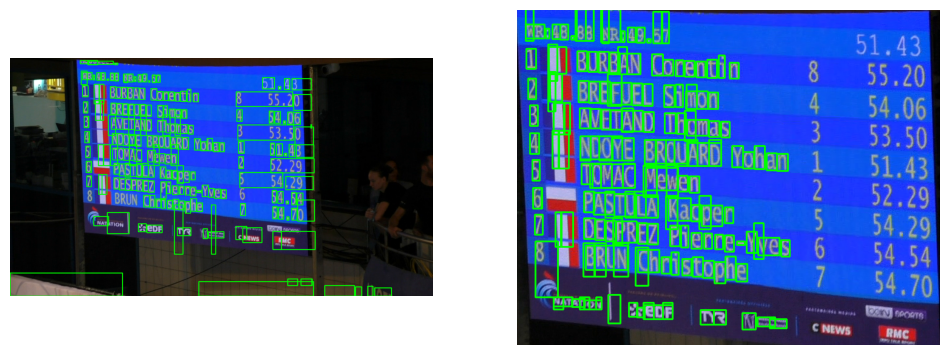

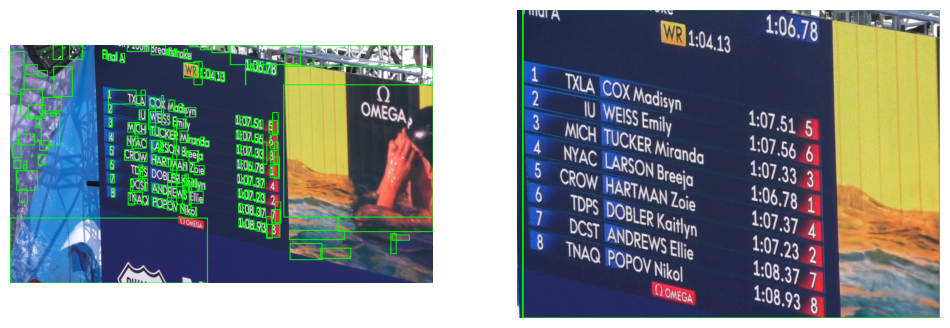

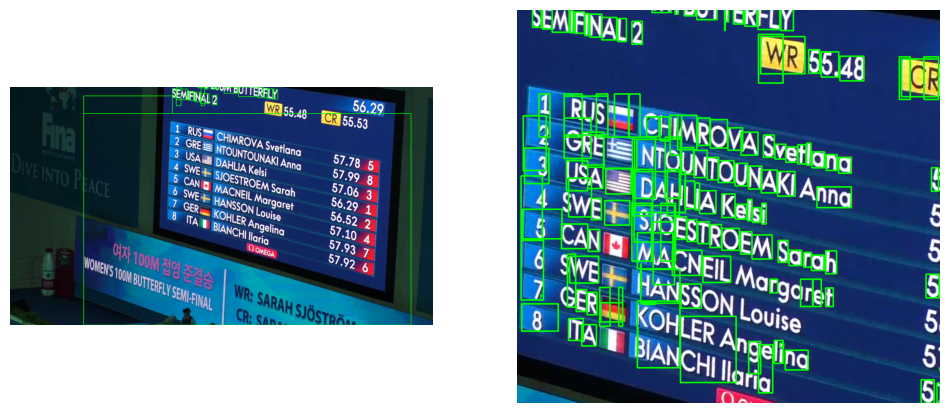

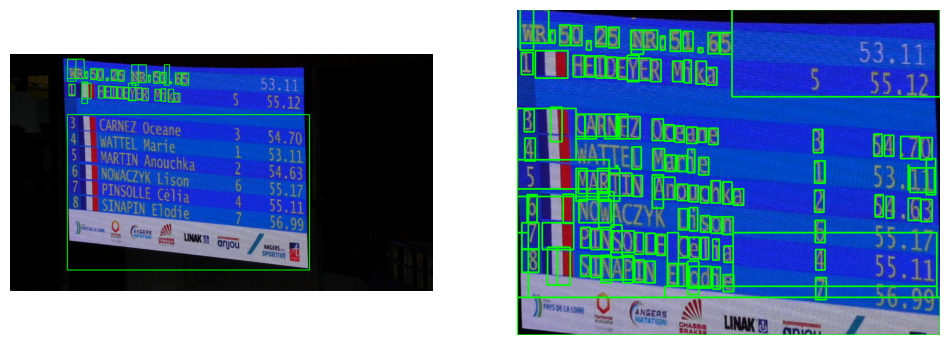

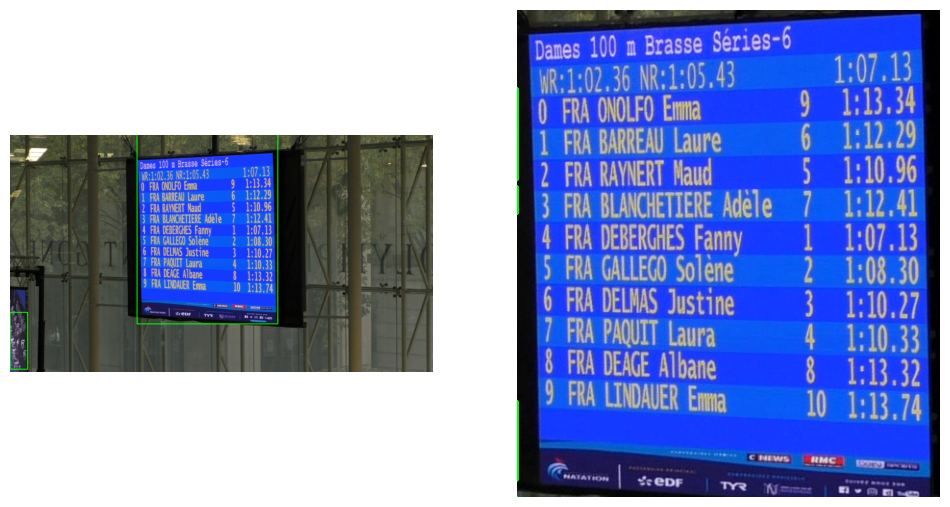

...

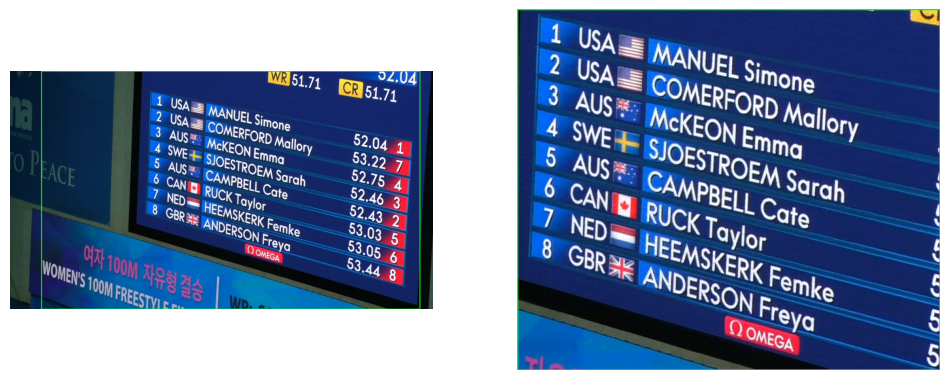

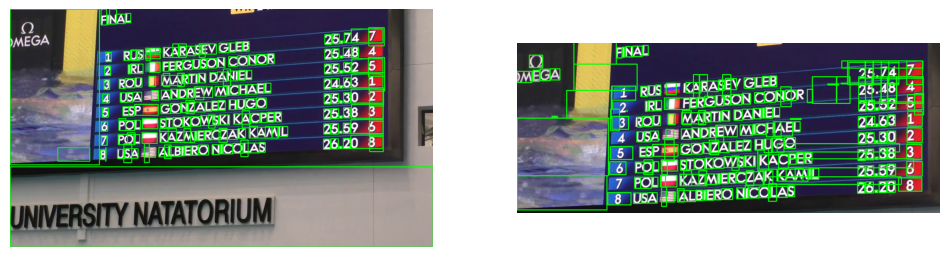

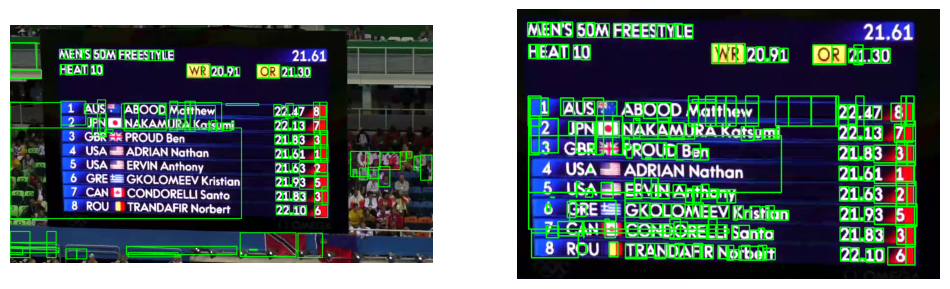

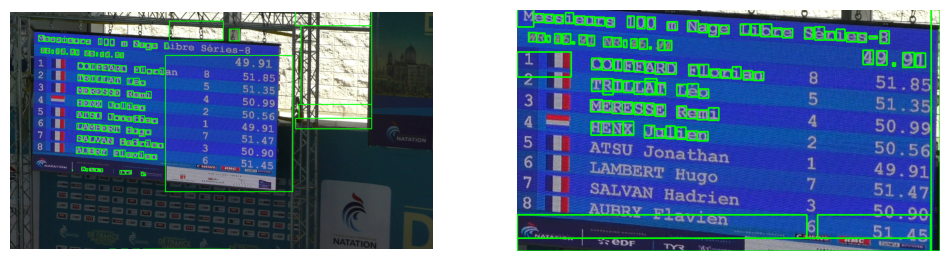

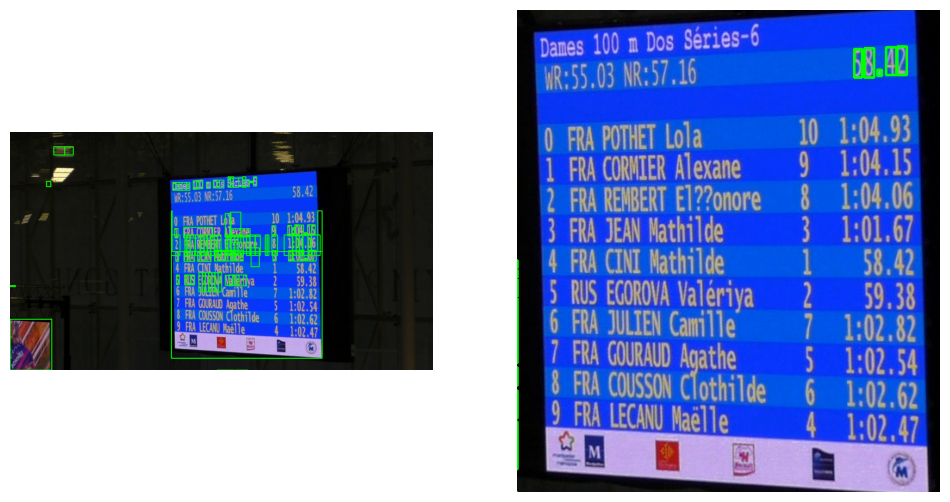

In [18]:
for i in range(len(path_tuples)):
    fig, ax = plt.subplots(1, 2, figsize=(12, 8))
    org_im_path = data_path + path_tuples[i][0]
    seg_im_path = data_path + 'ROI/' + 'CLIP_visual_prompt/' + path_tuples[i][0]
    org_im = cv2.imread(org_im_path)
    seg_im = cv2.imread(seg_im_path)
    org_im = cv2.cvtColor(org_im, cv2.COLOR_BGR2RGB)
    seg_im = cv2.cvtColor(seg_im, cv2.COLOR_BGR2RGB)

    org_bboxes = pytesseract.image_to_boxes(org_im, lang='eng+fra').split('\n')
    org_bboxes = [elem[2:] for elem in org_bboxes]
    org_bboxes = [elem.split(' ') for elem in org_bboxes]
    org_new_bboxes = []
    for i in range(len(org_bboxes)):
        if len(org_bboxes[i]) < 4:
            continue
        org_new_bboxes.append((int(org_bboxes[i][0]), int(org_bboxes[i][1]), int(org_bboxes[i][2]), int(org_bboxes[i][3])))

    seg_bboxes = pytesseract.image_to_boxes(seg_im, lang='eng+fra').split('\n')
    seg_bboxes = [elem[2:] for elem in seg_bboxes]
    seg_bboxes = [elem.split(' ') for elem in seg_bboxes]
    seg_new_bboxes = []
    for i in range(len(seg_bboxes)):
        if len(seg_bboxes[i]) < 4:
            continue
        seg_new_bboxes.append((int(seg_bboxes[i][0]), int(seg_bboxes[i][1]), int(seg_bboxes[i][2]), int(seg_bboxes[i][3])))

    org_h, org_w, org_c = org_im.shape
    seg_h, seg_w, seg_c = seg_im.shape

    for region in org_new_bboxes:
        x1, y1, x2, y2 = region
        cv2.rectangle(org_im, (x1, org_h - y1), (x2, org_h - y2), (0, 255, 0), 2)

    for region in seg_new_bboxes:
        x1, y1, x2, y2 = region
        cv2.rectangle(seg_im, (x1, seg_h - y1), (x2, seg_h - y2), (0, 255, 0), 2)

    ax[0].imshow(org_im)
    ax[1].imshow(seg_im)
    ax[0].axis('off')
    ax[1].axis('off')